In [1]:
%pip install pyserial

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [ ]:
import serial
import time

# Replace 'COM3' with your Arduino's port
arduino = serial.Serial(port='COM3', baudrate=9600, timeout=.1)

def write_read(x):
    arduino.write(bytes(x, 'utf-8'))
    time.sleep(0.05)
    data = arduino.readline()
    return data

while True:
    num = input("Enter a number: ")  # Take input
    value = write_read(num)
    print(value)  # Read the response from Arduino


In [14]:
import serial
import time

# Replace 'COM3' with your Arduino's port
arduino = serial.Serial(port='COM5', baudrate=9600, timeout=1)

def send_command(command):
    arduino.write(command.encode())  # Send the command to Arduino
    time.sleep(1)  # Wait for the servo to complete the action

# Test the servos
try:
    for i in range(360):
        send_command(f'{i}')  # Move to 0 degrees
        time.sleep(1)
    # print("Testing servos...")
    # send_command('1')  # Move to 0 degrees
    # print("Servos moved to 0 degrees.")
    # time.sleep(2)
    
    # # send_command('2')  # Move to 90 degrees
    # print("Servos moved to 90 degrees.")
    # time.sleep(2)
    
    # send_command('3')  # Move to 180 degrees
    # print("Servos moved to 180 degrees.")
    # time.sleep(2)
    
    # print("Test complete.")
except KeyboardInterrupt:
    print("Test interrupted.")
finally:
    arduino.close()  # Close the serial connection


Test interrupted.


In [16]:
import cv2

# Open the default camera (0 is usually the built-in/main camera)
cap = cv2.VideoCapture(0)

if not cap.isOpened():
    print("Error: Could not access the camera.")
    exit()

# Set up the pop-up window
cv2.namedWindow("Camera Feed", cv2.WINDOW_AUTOSIZE)

print("Press 'q' to exit.")

while True:
    ret, frame = cap.read()  # Capture frame-by-frame
    if not ret:
        print("Error: Could not read frame.")
        break

    # Display the resulting frame in the pop-up window
    cv2.imshow("Camera Feed", frame)

    # Break the loop if 'q' is pressed
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

# Release the camera and close all OpenCV windows
cap.release()
cv2.destroyAllWindows()


error: OpenCV(4.10.0) D:\a\opencv-python\opencv-python\opencv\modules\highgui\src\window.cpp:1284: error: (-2:Unspecified error) The function is not implemented. Rebuild the library with Windows, GTK+ 2.x or Cocoa support. If you are on Ubuntu or Debian, install libgtk2.0-dev and pkg-config, then re-run cmake or configure script in function 'cvNamedWindow'


In [17]:
%pip install opencv-python-headless opencv-python


Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


Press Ctrl+C to exit.


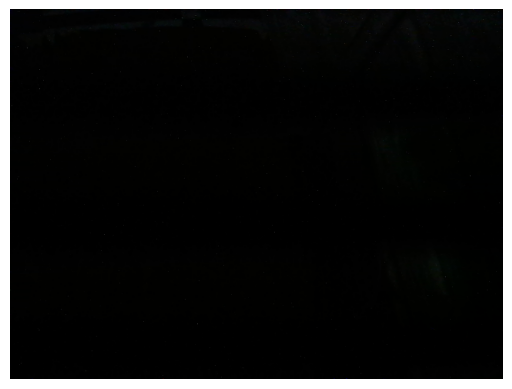

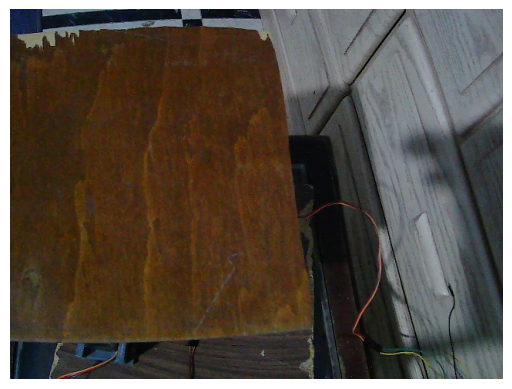

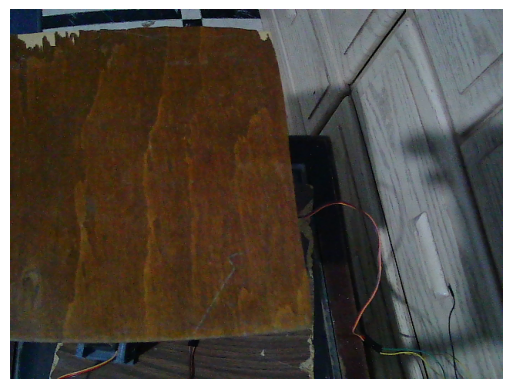

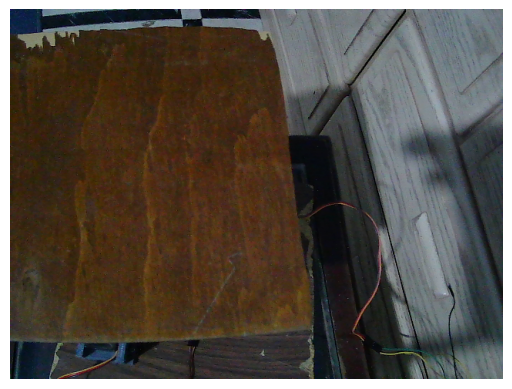

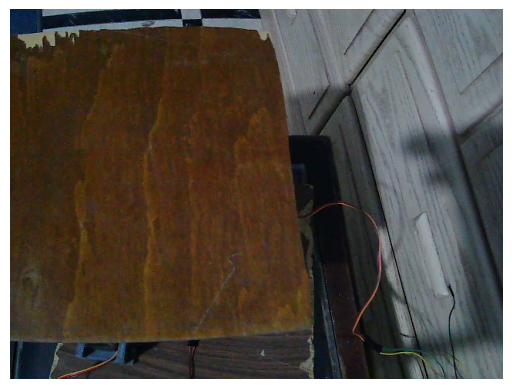

...

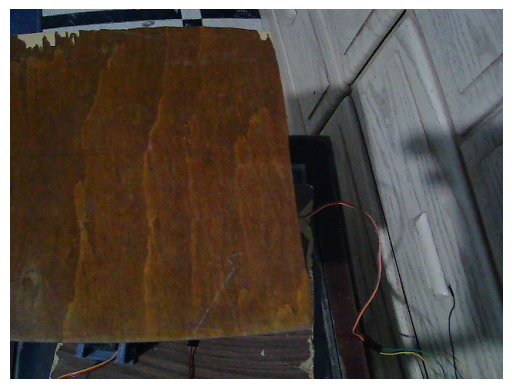

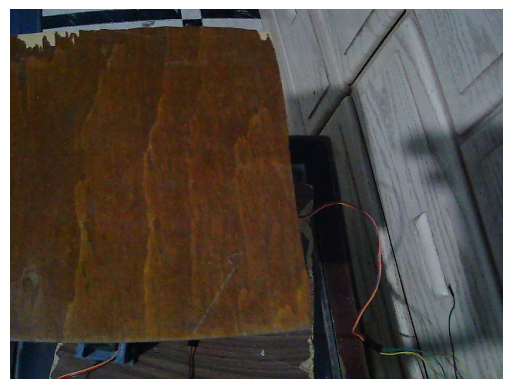

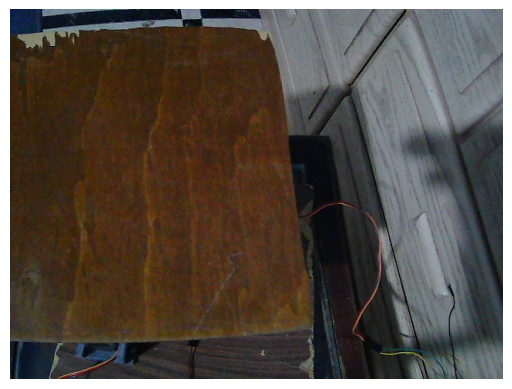

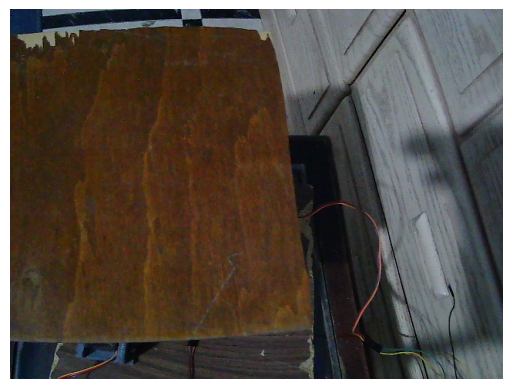

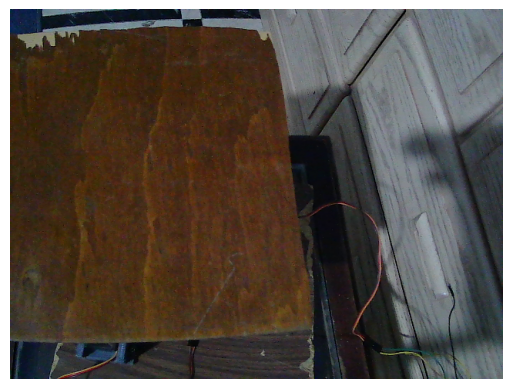

Exiting...


In [19]:
import cv2
import matplotlib.pyplot as plt

# Open the default camera
cap = cv2.VideoCapture(0)

if not cap.isOpened():
    print("Error: Could not access the camera.")
    exit()

print("Press Ctrl+C to exit.")

try:
    while True:
        ret, frame = cap.read()
        if not ret:
            print("Error: Could not read frame.")
            break

        # Convert BGR to RGB for displaying with matplotlib
        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

        # Display the frame using matplotlib
        plt.imshow(frame_rgb)
        plt.axis('off')
        plt.pause(0.001)  # Pause for a short time to update the display
        plt.clf()         # Clear the figure for the next frame

except KeyboardInterrupt:
    print("Exiting...")

finally:
    cap.release()
    plt.close()
